In [1]:
%load_ext autoreload
%autoreload 2

# add the parent directory in the path to import the packages
import sys
sys.path.append('../')

from WaterClassification.Radiometry import RadiometryDB
from WaterClassification.common import *
from WaterClassification.Fitting import BaseFit, MultiFit, FittingFunction, Functions, Fit, DfFit
from WaterClassification.Classification.clustering import *

from functools import partial
from itertools import product

from pathlib import Path

# Clustering Algorithm Performances
In the previous notebook we saw that with the same input features (wavelenghts) and same normalization, the different clustering algorithms achieved similar results until K=6.<br>
In this notebook we will increase the clustering to 15 to check if this convergence continues beyond K > 6.<br>
Additionally, we will check if the final clustering from the algorithms looks similar.


 ## Load the Database

In [2]:
# Open the Radiometry Database
db = RadiometryDB(r'D:\OneDrive - Agência Nacional de Águas\Data\GET-RadiometryDB')

db.load_radiometries(r_types=['Rrs', 'Rrs_OSOAA'], 
                     norm=True,                                                        # create the normalized bands and also the area
                     funcs=partial(calc_area, col_name='flatness', norm_band='700'),   # create the flatness band
                     qry="SPM > 0 and Status != 'Deleted' and Status != 'Suspicious'"  # clear deleted and no data
                    )
rrs = db.rdmtries['Rrs']

rrs.head(3)

Radiometries ['Rrs', 'Rrs_OSOAA'] loaded in dictionary .rdmtries


,Area_2,Station_2,Measurement,Start_Date_2,SPM_2,Status_2,Description_2,319,320,321,...,n943,n944,n945,n946,n947,n948,n949,n950,n951,flatness
Id,,,,,,,,,,,,,,,,,,,,,
0,Descoberto,Ponto_1,20160318-1139,2016-03-18 11:39:00,7.0,Ok,GIANCARLO_ CAMP1_1,NaN,0.003272,0.003054,...,0.000138,0.000127,0.000149,0.000184,0.000180,0.000186,0.000191,0.000213,NaN,-1.480905
1,Descoberto,Ponto_2,20160318-1214,2016-03-18 12:14:00,8.4,Ok,GIANCARLO_ CAMP1_2,NaN,0.002663,0.002460,...,0.000193,0.000212,0.000206,0.000210,0.000192,0.000204,0.000186,0.000189,NaN,-1.484569
2,Descoberto,Ponto_3,20160318-1228,2016-03-18 12:28:00,5.8,Ok,GIANCARLO_ CAMP1_3,NaN,0.003356,0.003116,...,0.000143,0.000146,0.000142,0.000146,0.000158,0.000165,0.000162,0.000154,NaN,-1.755808


In [3]:
# deleting outliers
rrs.drop(index=[410, 418, 390, 520, 409, 658], inplace=True, errors='ignore')
len(rrs)

869

In [4]:
fit_bands = s2bands + s2bands_norm + ['area', 'b865/b665']

In [5]:
high = rrs.query("SPM > 80")
low = rrs.query("SPM <= 80")

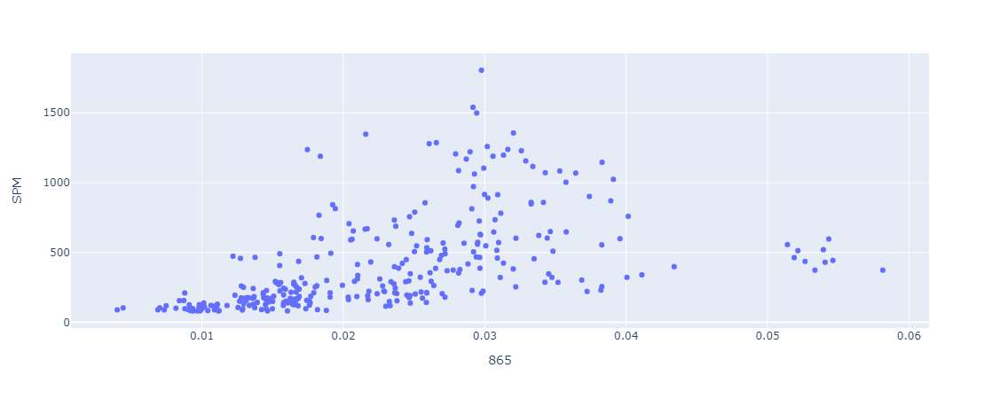

In [6]:
px.scatter(high, x='865', y='SPM')

In [7]:
mfit = MultiFit(high, fit_bands, BaseFit.available_funcs, n_cpus=6, optimize_metric=True)

In [8]:
mfit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
Power on b865/b665,Power,b865/b665,0.8094,21309.8,145.979,0.2788,6.62734e+06,"[1514.201427476508, 3.041498366099086, 83.7149...",311
Exponential on b865/b665,Exponential,b865/b665,0.7575,27113,164.66,0.2973,8.43214e+06,"[144.17956331705068, -161.59291319124566]",311
Linear on b865/b665,Linear,b865/b665,0.5949,45289.4,212.813,0.3682,1.4085e+07,"[928.4992255039381, -138.70469859001406]",311
Exponential on n865,Exponential,n865,0.4999,55914.5,236.463,0.4161,1.73894e+07,"[189092.32905507402, -189353.93626957783]",311
Linear on n865,Linear,n865,0.4995,55952.4,236.543,0.4163,1.74012e+07,"[436519.4410719206, -262.16658810933086]",311


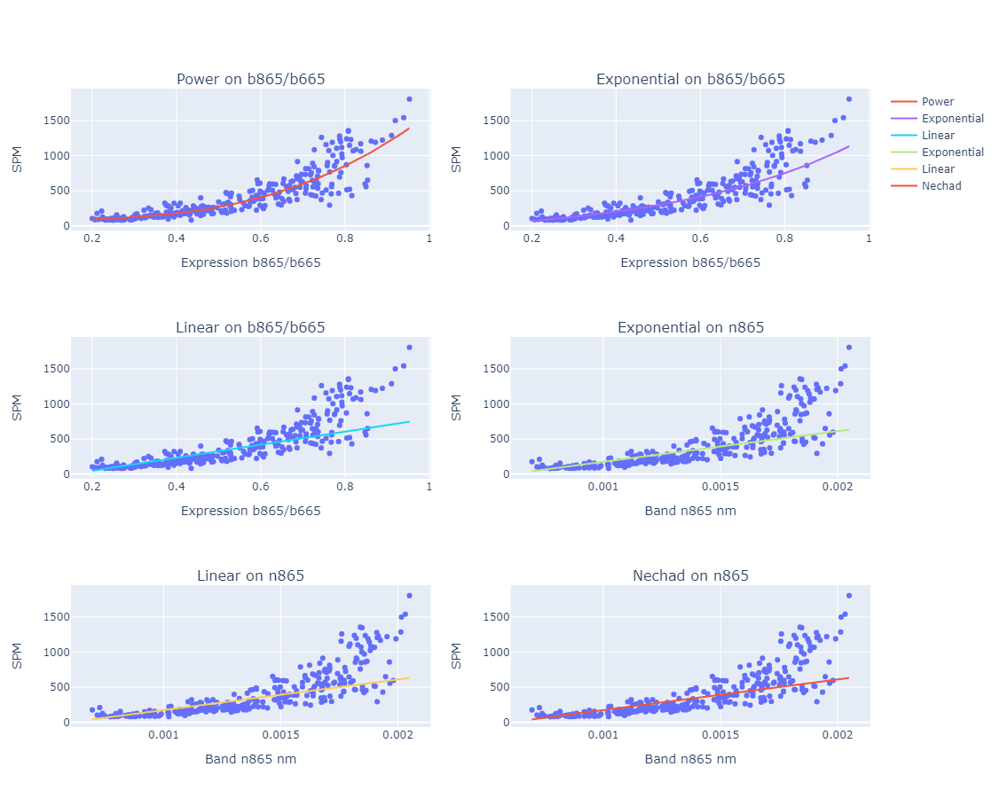

In [9]:
mfit.plot_best_fits(n=6, cols=2)

In [10]:
mfit = MultiFit(high, fit_bands, BaseFit.available_funcs, n_cpus=6, optimize_metric=False)

In [11]:
mfit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
Power on b865/b665,Power,b865/b665,0.8172,20441,142.972,0.2833,6.35716e+06,"[1693.4958551669101, 3.3199569206481727, 100.1...",311
Exponential on b865/b665,Exponential,b865/b665,0.8038,21937.1,148.112,0.4035,6.82243e+06,"[182.98035046346266, -272.0196538030946]",311
Linear on 865,Linear,865,0.2618,82533.4,287.286,0.611,2.56679e+07,"[17093.37243897727, 17.6703353758597]",311
Nechad on 865,Nechad,865,0.2618,82533.4,287.286,0.611,2.56679e+07,"[5440.987541124149, 711338.8520761713, 17.6704...",311
Power on 940,Power,940,0.3506,72600.8,269.445,0.6149,2.25788e+07,"[38356.7970630397, 1.0460209922145813, 46.5418...",311


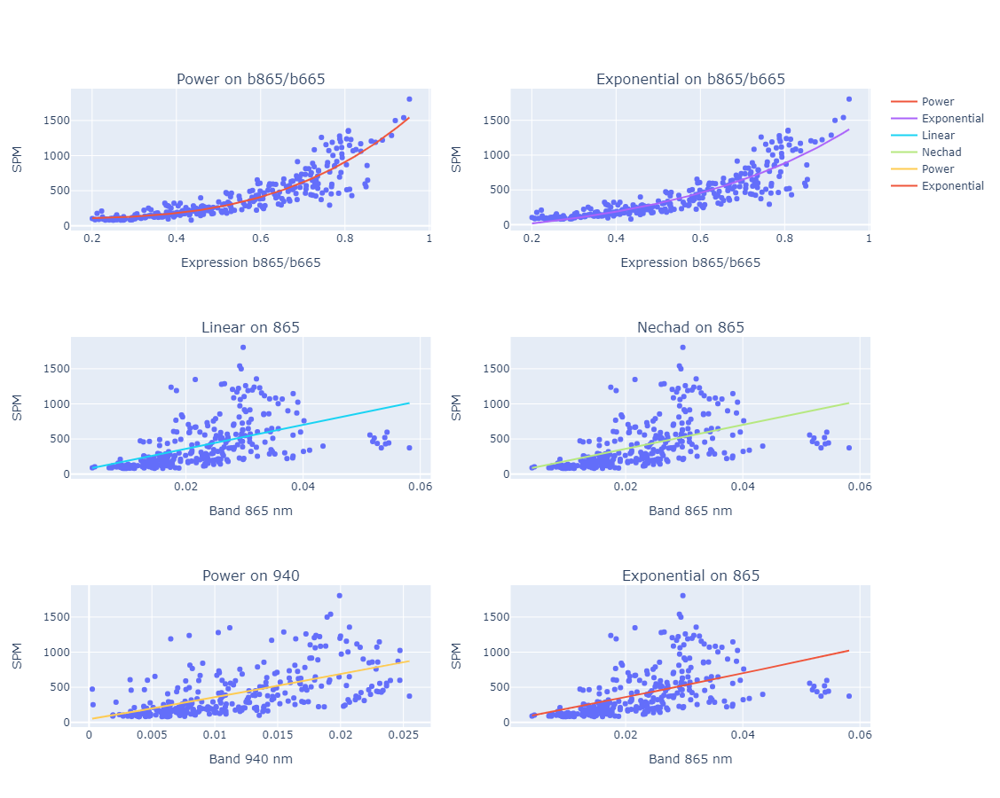

In [12]:
mfit.plot_best_fits(n=6, cols=2)

In [13]:
ratios = [f'b{b1}/b{b2}' for b1, b2 in  product(s2bands, s2bands) if int(b1) > int(b2)]
fit_bands = s2bands + s2bands_norm + ratios
high_fit = MultiFit(high, fit_bands, BaseFit.available_funcs, n_cpus=6, optimize_metric=False)

In [ ]:
high_fit.summary()

In [ ]:
high_fit.plot_best_fits(n=6, cols=2)

In [26]:
low_fit = MultiFit(low, fit_bands, BaseFit.available_funcs, n_cpus=6, optimize_metric=False)

In [27]:
low_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
Linear on 705,Linear,705,0.6724,131.54,11.4691,0.5976,73399.5,"[1256.8180466992208, 0.4290263384568294]",558
Nechad on 705,Nechad,705,0.6724,131.54,11.4691,0.5976,73399.5,"[400.05757142523873, 1483887.8586315985, 0.429...",558
Exponential on 705,Exponential,705,0.6663,133.986,11.5752,0.6101,74764,"[516.2123134457353, -515.3301076585245]",558
Linear on 783,Linear,783,0.6936,123.03,11.0919,0.6552,68650.8,"[2860.2125218657434, 2.139394403043928]",558
Nechad on 783,Nechad,783,0.6936,123.03,11.0919,0.6552,68650.8,"[910.4338823085717, 1156650.7500026813, 2.1393...",558


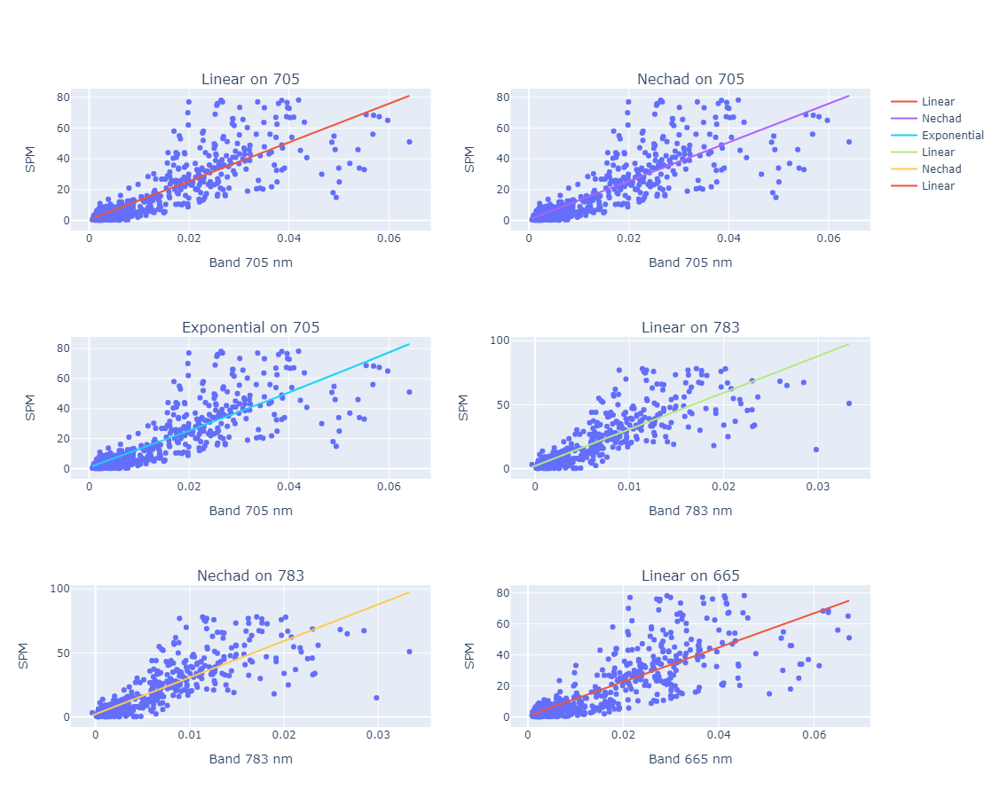

In [29]:
low_fit.plot_best_fits(n=6, cols=2)

In [14]:
def norm_func(x, a, r0, b, rsat): return (a*(x-r0)**b)/(rsat-x)

In [16]:
BaseFit.available_funcs = BaseFit.available_funcs + [FittingFunction('Norm', norm_func)]

In [17]:
BaseFit.available_funcs

[Linear, Exponential, Power, Nechad, Norm]

# New Fitting Function - Norm

In [18]:
ratios = [f'b{b1}/b{b2}' for b1, b2 in  product(s2bands, s2bands) if int(b1) > int(b2)]
fit_bands = s2bands + s2bands_norm + ratios
high_fit = MultiFit(high, fit_bands, BaseFit.available_funcs, n_cpus=6, optimize_metric=False)

In [22]:
high_fit.summary(n=5)

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
Nechad on b740/b705,Nechad,b740/b705,0.8687,14676.3,121.146,0.258,4.56432e+06,"[48.30866727229953, 3.2535634901606723, -41.39...",311
Power on b842/b705,Power,b842/b705,0.8591,15750.2,125.5,0.2628,4.89831e+06,"[2014.3995027741728, 4.580835158377067, 117.71...",311
Power on b865/b705,Power,b865/b705,0.8614,15493.6,124.474,0.2681,4.81852e+06,"[2255.0514449519223, 4.044775126642173, 117.53...",311
Power on b740/b705,Power,b740/b705,0.8652,15071.9,122.768,0.2685,4.68737e+06,"[2072.6928124326264, 7.9555280453958055, 130.8...",311
Power on b783/b705,Power,b783/b705,0.8129,20915.1,144.621,0.2714,6.50461e+06,"[1426.97149552828, 6.499380719933458, 101.4356...",311


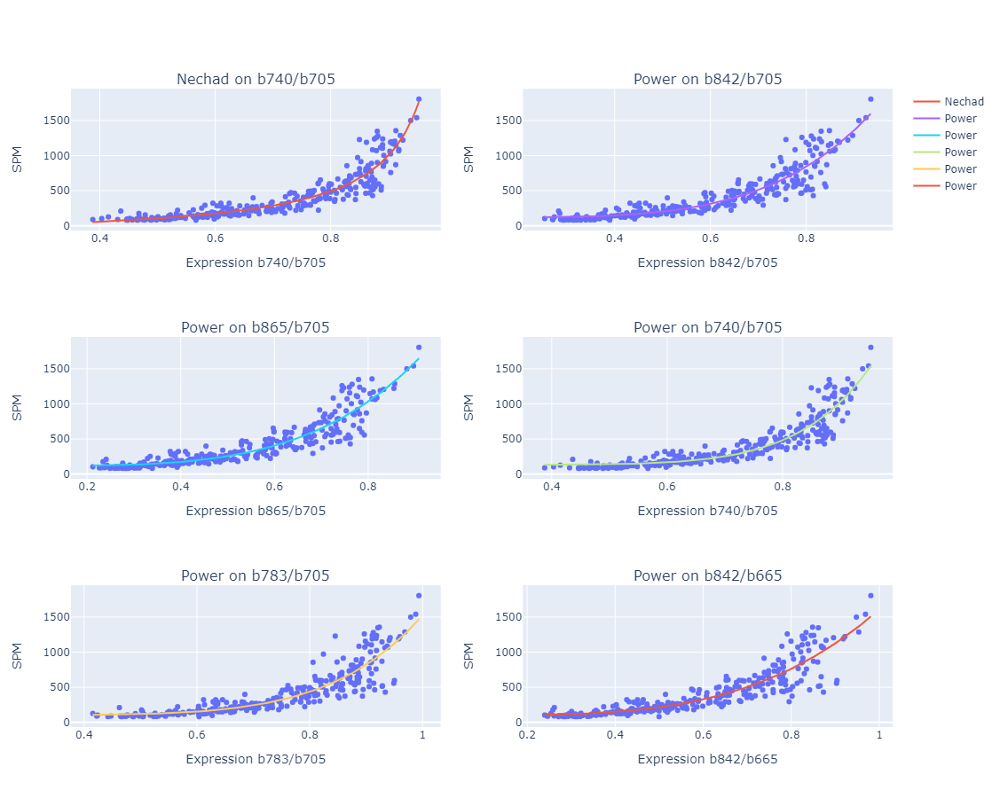

In [20]:
high_fit.plot_best_fits(n=6, cols=2)

In [26]:
low_fit = MultiFit(low, fit_bands, BaseFit.available_funcs, n_cpus=6, optimize_metric=False)

In [27]:
low_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
Linear on 705,Linear,705,0.6724,131.54,11.4691,0.5976,73399.5,"[1256.8180466992208, 0.4290263384568294]",558
Nechad on 705,Nechad,705,0.6724,131.54,11.4691,0.5976,73399.5,"[400.05757142523873, 1483887.8586315985, 0.429...",558
Exponential on 705,Exponential,705,0.6663,133.986,11.5752,0.6101,74764,"[516.2123134457353, -515.3301076585245]",558
Linear on 783,Linear,783,0.6936,123.03,11.0919,0.6552,68650.8,"[2860.2125218657434, 2.139394403043928]",558
Nechad on 783,Nechad,783,0.6936,123.03,11.0919,0.6552,68650.8,"[910.4338823085717, 1156650.7500026813, 2.1393...",558


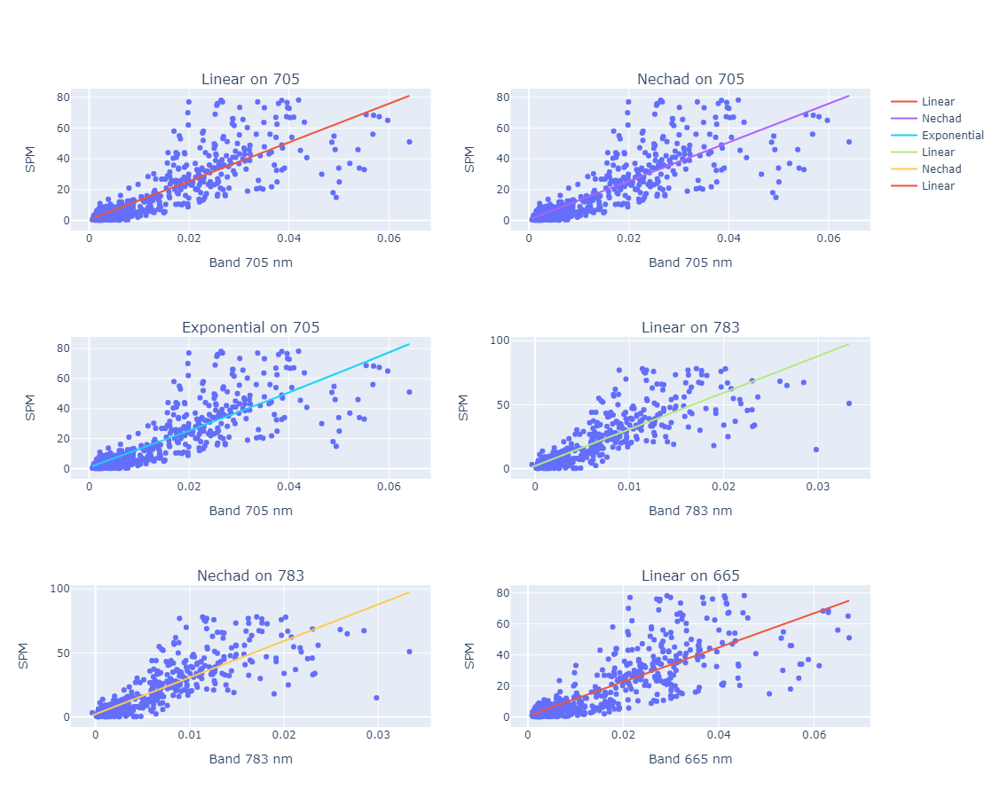

In [29]:
low_fit.plot_best_fits(n=6, cols=2)

# Testing Normalized Differences

In [24]:
norm_difs = [f'(b{b1}-b{b2})/(b{b1}+b{b2})' for b1, b2 in  product(s2bands, s2bands) if int(b1) > int(b2)]
fit_bands = s2bands + s2bands_norm + norm_difs
high_fit = MultiFit(high, fit_bands, BaseFit.available_funcs, n_cpus=6, optimize_metric=False)

In [25]:
high_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
Exponential on (b940-b560)/(b940+b560),Exponential,(b940-b560)/(b940+b560),0.5658,48543.6,220.326,0.5574,1.50971e+07,"[1675.9269017920296, -165.84217218098024]",311
Exponential on (b940-b490)/(b940+b490),Exponential,(b940-b490)/(b940+b490),0.4693,59334.1,243.586,0.5652,1.84529e+07,"[745.7582843614917, -30.71549962449558]",311
Exponential on (b940-b443)/(b940+b443),Exponential,(b940-b443)/(b940+b443),0.3841,68855.7,262.404,0.6056,2.14141e+07,"[482.34481655959405, 26.482985604355385]",311
Linear on 865,Linear,865,0.2618,82533.4,287.286,0.611,2.56679e+07,"[17093.37243897727, 17.6703353758597]",311
Nechad on 865,Nechad,865,0.2618,82533.4,287.286,0.611,2.56679e+07,"[5440.987541124149, 711338.8520761713, 17.6704...",311


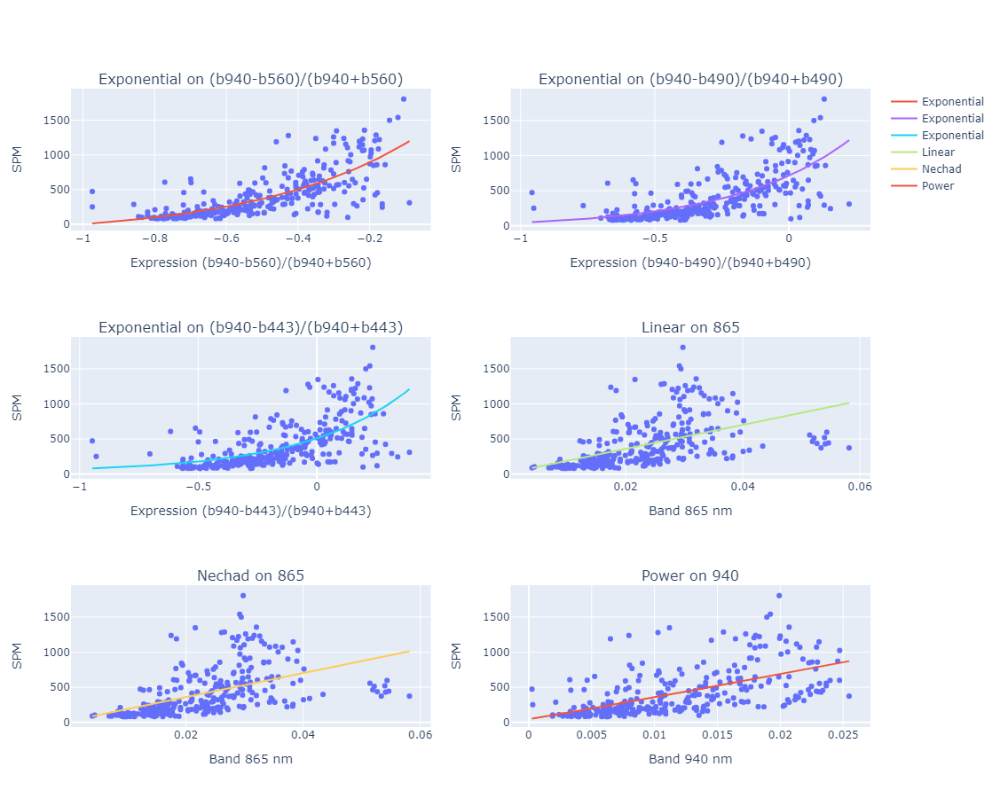

In [26]:
high_fit.plot_best_fits(n=6, cols=2)

In [27]:
low_fit = MultiFit(low, fit_bands, BaseFit.available_funcs, n_cpus=6, optimize_metric=False)

In [28]:
low_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
Linear on 705,Linear,705,0.6724,131.54,11.4691,0.5976,73399.5,"[1256.8180466992208, 0.4290263384568294]",558
Nechad on 705,Nechad,705,0.6724,131.54,11.4691,0.5976,73399.5,"[400.05757142523873, 1483887.8586315985, 0.429...",558
Exponential on 705,Exponential,705,0.6663,133.986,11.5752,0.6101,74764,"[516.2123134457353, -515.3301076585245]",558
Linear on 783,Linear,783,0.6936,123.03,11.0919,0.6552,68650.8,"[2860.2125218657434, 2.139394403043928]",558
Nechad on 783,Nechad,783,0.6936,123.03,11.0919,0.6552,68650.8,"[910.4338823085717, 1156650.7500026813, 2.1393...",558


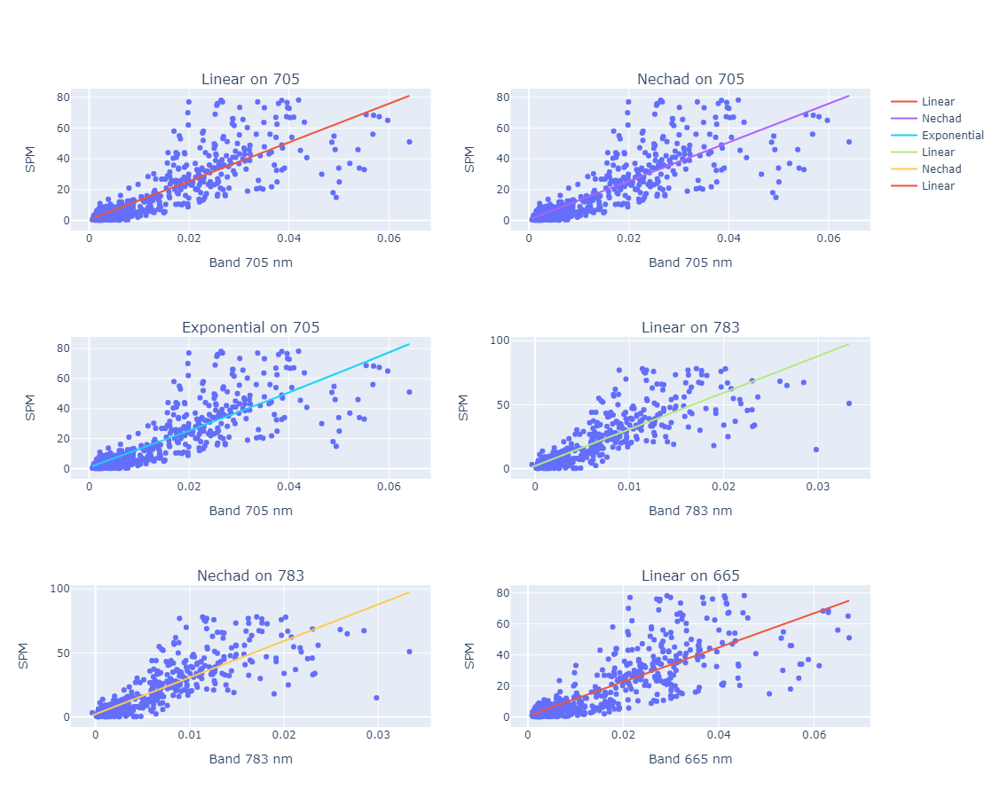

In [29]:
low_fit.plot_best_fits(n=6, cols=2)

In [33]:
Functions.linear.func

<function WaterClassification.Fitting.fitting_core.Functions.<lambda>(x, a, b)>

In [34]:
def lin2(x, a, b, c):
    return a*x[:, 0] + b*x[:, 1] + c

linear2 = FittingFunction('Linear2', lin2)

In [38]:
fit_bands = s2bands + s2bands_norm + ['b865/b665']
mfit = MultiFit(high, fit_bands, [Functions.linear])

In [39]:
mfit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
Linear on 865,Linear,865,0.2618,82533.4,287.286,0.611,2.56679e+07,"[17093.37243897727, 17.6703353758597]",311
Linear on 940,Linear,940,0.3505,72610.2,269.463,0.6208,2.25818e+07,"[32709.419375029778, 31.98223172507595]",311
Linear on 842,Linear,842,0.2214,87047.5,295.038,0.6416,2.70718e+07,"[15126.794498630237, 28.95763380802632]",311
Linear on n490,Linear,n490,0.1692,92882.9,304.767,0.7348,2.88866e+07,"[-940695.4869337741, 1540.2057202092265]",311
Linear on 740,Linear,740,0.0975,100900,317.648,0.7442,3.13799e+07,"[9577.269886610778, 115.32498708078988]",311


In [57]:
Fit(Functions.linear, x=high['865'], y=high['SPM'],optimize_metric=BaseFit.rmsle)

Linear - qty: 311 | R^2: 0.2181 MSE: 87415.2773 RMSE: 295.6607 RMSLE: 0.5631 SSE: 27186151.2436 

In [99]:
Fit(linear2, x=high[['865', '842']].to_numpy(), y=high['SPM'], optimize_metric=BaseFit.rmsle)

Linear2 - qty: 311 | R^2: 0.4728 MSE: 58946.3232 RMSE: 242.7886 RMSLE: 0.4465 SSE: 18332306.5146 

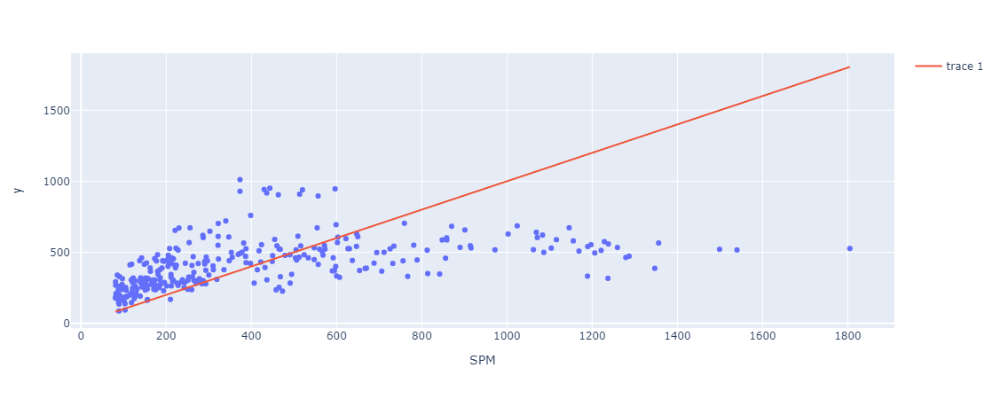

In [100]:
dffit = DfFit(high, Functions.linear, expr_x='865', expr_y='SPM')
dffit.plot_pred_vs_targ()

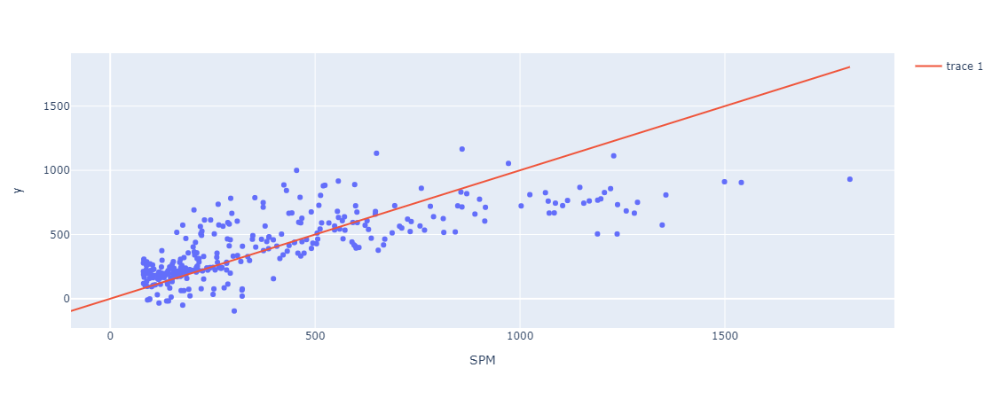

In [182]:
dffit = DfFit(high, linear2, ('865', '842'), expr_y='SPM', optimize_metric=None)

dffit.plot_pred_vs_targ()

# Testing 2 var functions

In [7]:
ratios = [f'b{b1}/b{b2}' for b1, b2 in  product(s2bands, s2bands) if int(b1) > int(b2)]
fit_bands = s2bands + s2bands_norm + ratios

# include the 2 variables options
fit_bands = fit_bands + [t for t in product(fit_bands, fit_bands) if t[0] != t[1]]
len(fit_bands)

4225

In [143]:
funcs = [Functions.linear, Functions.power, Functions.nechad, Functions.linear2, Functions.lin_nechad, Functions.nechad3,
         Functions.power2, Functions.expo2, Functions.lin_power, Functions.lin_expo, Functions.power_expo, Functions.power_nechad, Functions.expo_nechad]

In [144]:
mfit = MultiFit(high, fit_bands, funcs=funcs, n_cpus=6)

Data is ready! 42445 records!


In [149]:
df = mfit.summary(n=None)
df

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
"Linear_Nechad on ('b740/b665', 'b740/b705')",Linear_Nechad,"(b740/b665, b740/b705)",0.8699,14545.3,120.604,0.2465,4.5236e+06,"[-284.37294987949656, 198.48769400297812, 1.05...",311
"Power_Nechad on ('b740/b665', 'b740/b705')",Power_Nechad,"(b740/b665, b740/b705)",0.8699,14544.6,120.601,0.2467,4.52337e+06,"[-265.0055597218628, 1.2958848816087807, 201.3...",311
"Power2 on ('b740/b705', 'b865/b705')",Power2,"(b740/b705, b865/b705)",0.8716,14351.2,119.796,0.2481,4.46321e+06,"[1247.5714846077492, 5.506518722149511, 1562.9...",311
"Power2 on ('b865/b705', 'b740/b705')",Power2,"(b865/b705, b740/b705)",0.8716,14351.2,119.796,0.2481,4.46321e+06,"[1563.0215720522094, 8.628642128653244, 1247.6...",311
"Power_Nechad on ('b865/b665', 'b842/b705')",Power_Nechad,"(b865/b665, b842/b705)",0.8638,15226,123.394,0.2485,4.73529e+06,"[-745.4545236244647, 1.2198212254693381, 572.6...",311
...,...,...,...,...,...,...,...,...,...
"Expo_Nechad on ('b940/b783', 'b560/b490')",Expo_Nechad,"(b940/b783, b560/b490)",None,None,None,None,None,None,311
"Expo_Nechad on ('b940/b783', 'b665/b490')",Expo_Nechad,"(b940/b783, b665/b490)",None,None,None,None,None,None,311
"Expo_Nechad on ('b940/b842', 'b560/b490')",Expo_Nechad,"(b940/b842, b560/b490)",None,None,None,None,None,None,311
"Expo_Nechad on ('b940/b842', 'b705/b560')",Expo_Nechad,"(b940/b842, b705/b560)",None,None,None,None,None,None,311


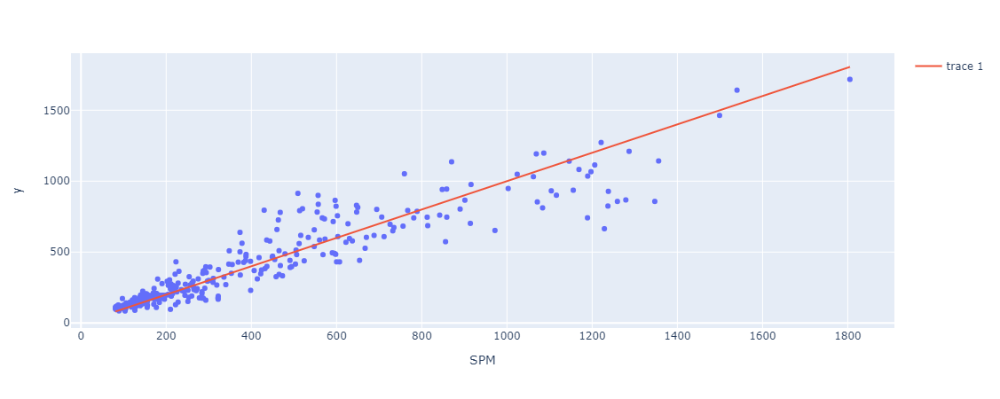

In [146]:
mfit.best_fit.plot_pred_vs_targ()

In [150]:
low_mfit = MultiFit(low, fit_bands, funcs=funcs, n_cpus=6)

Data is ready! 42445 records!


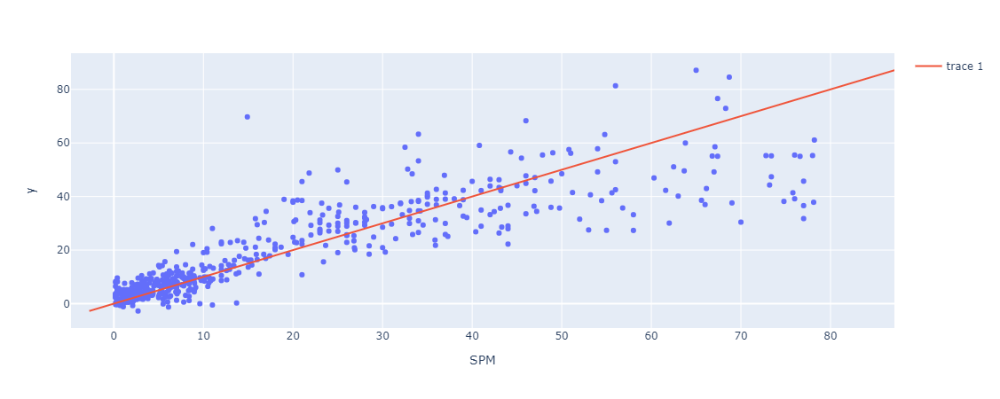

In [153]:
low_mfit.best_fit.plot_pred_vs_targ()

In [152]:
df = low_mfit.summary(n=None)
df.head(5)

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
"Power_Expo on ('443', '705')",Power_Expo,"(443, 705)",0.7689,92.8017,9.6334,0.5612,51783.3,"[-22003.169413168074, 1.6050957752877204, 787....",558
"Power_Expo on ('443', '665')",Power_Expo,"(443, 665)",0.7143,114.707,10.7101,0.5633,64006.5,"[-12709.616432829773, 1.4373059662577896, 732....",558
"Linear_Power on ('665', '443')",Linear_Power,"(665, 443)",0.7191,112.8,10.6207,0.5662,62942.3,"[1804.324958857987, -9558.59020702336, 1.35869...",558
"Power_Nechad on ('443', '665')",Power_Nechad,"(443, 665)",0.7191,112.8,10.6207,0.5662,62942.3,"[-9558.101902180568, 1.3586749960545725, 1804....",558
"Power_Expo on ('490', '665')",Power_Expo,"(490, 665)",0.7111,115.989,10.7698,0.5705,64721.9,"[-17542.88848171396, 1.6358614447045046, 744.8...",558


# Comparing new functions to clustering baseline 
### (k-means-1nm-rawnorm-standard)

In [155]:
kmeans = load_obj(f'../data/k-means_1nm_rawnorm_Standard.multicluster')
kmeans.sort_by_variable()

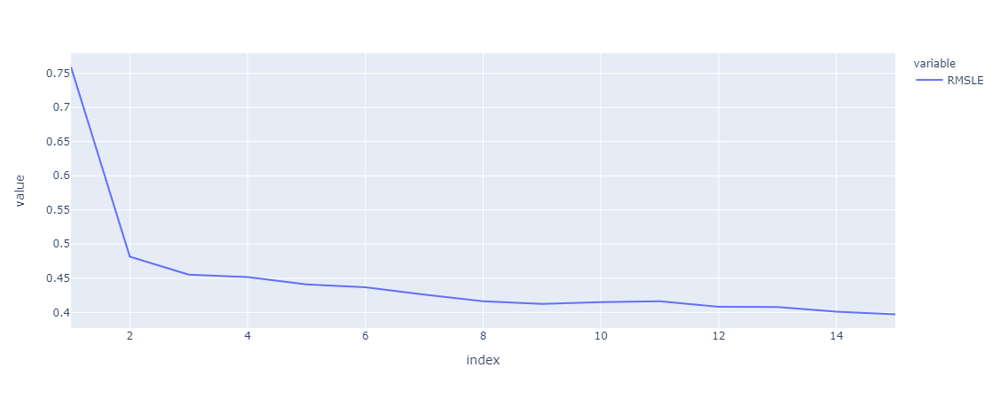

In [156]:
kmeans.plot_parameter()

In [163]:
kmeans_nfuncs = MultiClustering(rrs, all_wls+all_wls_norm, range_clusters=(1, 7), algo='k-means', norm='Standard')
kmeans_nfuncs.fit(fit_bands, funcs, n_cpus=6, optimize_metric=True)

Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!
Data is ready! 42445 records!


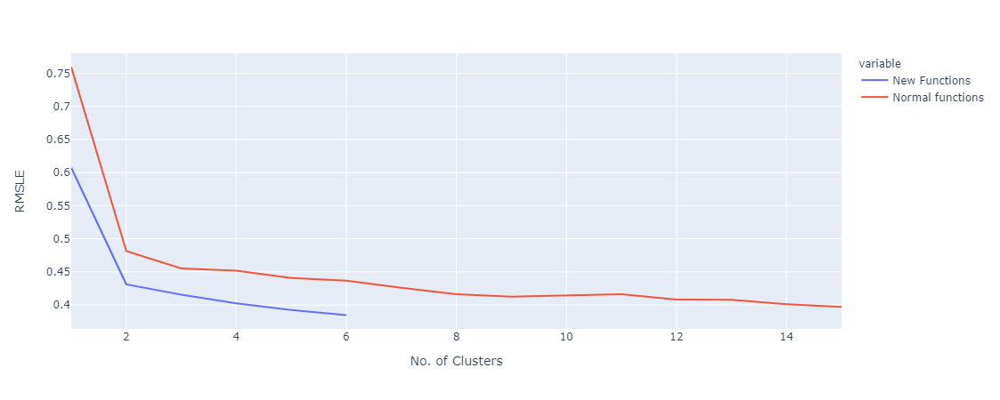

In [166]:
MultiClustering.plot_metric_by_cluster([kmeans_nfuncs, kmeans], ['New Functions', 'Normal functions'])
# kmeans_nfuncs.plot_parameter()

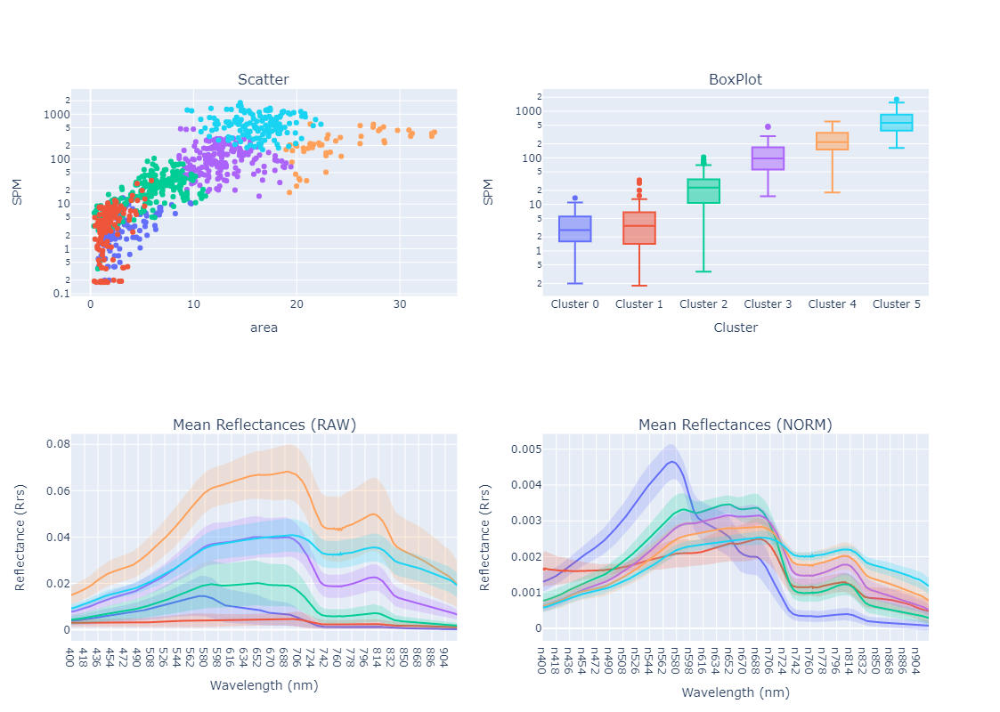

In [167]:
kmeans_nfuncs[6].plot_summary()

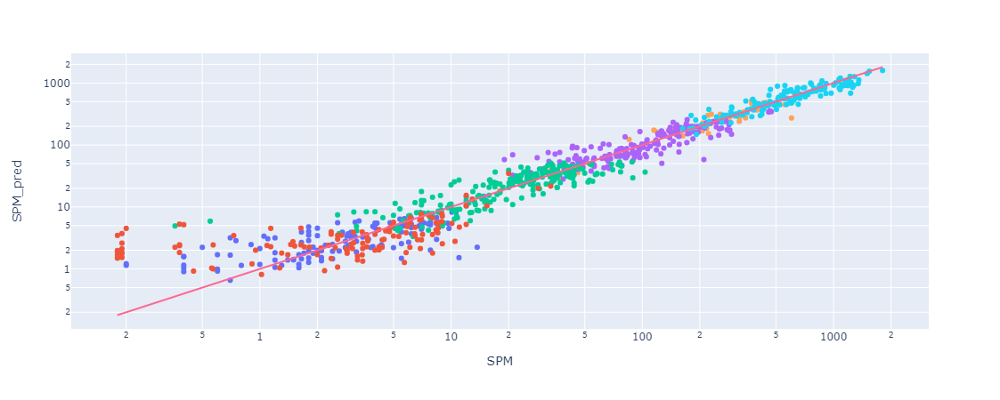

In [173]:
kmeans_nfuncs[6].group_fit.plot_pred_vs_targ(color='cluster', log_y=True, log_x=True)

In [174]:
kmeans_nfuncs[6].group_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
0,Linear2,"(705, b783/b490)",0.3871,4.6539,2.1573,0.4250,5.770816e+02,"[313.3731377225066, 9.487917139637462, 0.19614...",124
1,Power2,"(665, b560/b490)",0.6041,9.2609,3.0432,0.5756,1.222434e+03,"[106699.79588227396, 2.163166181345808, 0.9700...",132
2,Power2,"(443, 783)",0.5962,139.6525,11.8175,0.3870,3.114251e+04,"[-15766.033191441822, 1.6635352660570928, 9731...",223
3,Power_Nechad,"(b740/b705, b842/b490)",0.7764,1513.2607,38.9007,0.3288,2.905461e+05,"[1139.0777528728547, 3.9707664111738135, 0.017...",192
4,Power_Nechad,"(865, b842/b490)",0.8079,4492.9744,67.0297,0.2153,2.291417e+05,"[12978.48371611556, 1.098146703977688, -5.6016...",51
5,Power2,"(b740/b705, 665)",0.8331,19620.1008,140.0718,0.2010,2.884155e+06,"[2058.5015881500676, 8.504515163787865, 0.7822...",147
overall,NaN,NaN,0.9473,3954.8729,62.8878,0.3847,3.436785e+06,None,0


In [175]:
kmeans[6].group_fit.summary()

,func,band,R^2,MSE,RMSE,RMSLE,SSE,params,qty
0,Power,705,0.3578,5.9404,2.4373,0.4524,7.841288e+02,"[89.50529074850158, 0.5803019822196085, -0.670...",132
1,Exponential,705,0.4695,11.6128,3.4077,0.6213,1.509659e+03,"[336.7366616667209, -336.48441142082487]",130
2,Exponential,783,0.5227,206.0866,14.3557,0.4214,4.657557e+04,"[1517.6036478047295, -1516.3849117287195]",226
3,Power,b865/b665,0.6496,2353.7557,48.5155,0.4344,4.425061e+05,"[1191.501679737033, 2.2220102541529725, 15.569...",188
4,Exponential,n865,0.7420,6697.9107,81.8408,0.2405,2.947081e+05,"[177895.55159282408, -178173.0025782417]",44
5,Power,b865/b665,0.7712,27775.4583,166.6597,0.2648,4.138543e+06,"[1898.8923738746307, 3.6121025419632993, 93.95...",149
overall,NaN,NaN,0.9245,5667.0044,75.2795,0.4368,4.924627e+06,None,0


# Criar uma MultiFunction
poderia fazer multifunc(linear, linear) = regressao linear multipla 2 variaveis<br>
multifunc(linear, linear, linear) = regerssao linear 3 variaveis<br>
multifunc(linear, power, power)

In [161]:
import string

def multifunc(*funcs):
    # create a list of arguments
    arg_list = []
    for i, func in enumerate(funcs):
        arg_list.append([f'f{i}_{arg}' for arg in func.func.__code__.co_varnames[1:]])
        
        
        
    flat_args = [item for sublist in arg_list for item in sublist]

    s = f"def new_func(x, {','.join(flat_args)}): return "
    
    s_funcs = []
    for 
    
#         return f1(x[:, 0], a, b) + f2(x[:, 1], c, d)
    
    return s

In [162]:
multifunc(Functions.linear, Functions.linear)

'def new_func(x, f0_a,f0_b,f1_a,f1_b): return '

In [135]:
type(Functions.linear.func)

function

In [137]:
Functions.linear.func.__code__.co_varnames[1:]

('a', 'b')

In [80]:
for i in (2, 5):
    print(i)

2
5


In [120]:
x = BaseFit.parse_expr_df(high, ('865', '665'))

In [77]:
pd.DataFrame([BaseFit.parse_expr_df(high, 'b865/b665'), BaseFit.parse_expr_df(high, 'b865/b665')], ).T.to_numpy()

(311, 2)